In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.unicode_minus'] = False
import warnings
# 忽略所有警告
warnings.filterwarnings("ignore")
df = pd.read_excel('2025-6-26公众号Python机器学习AI.xlsx')
df

,Sample,1-Methyladenosine_pos-001,1-Methylhistidine_pos-002,1-Methylnicotinamide_pos-003,2-Aminoadipic acid_pos-005,2-Aminooctanoic acid_pos-006,3-Indoleacrylic acid_pos-012,4-Pyridoxic acid_pos-018,5-Hydroxyindoleacetic acid_pos-021,5-Hydroxylysine_pos-023,...,UMP_neg-087,Uridine_neg-088,Xanthine_neg-089,Xanthurenic acid_neg-090,α-D-Galactose 1-phosphate_neg-092,α-Ketoglutaric acid_neg-093,α-ketoisovaleric acid_neg-094,malate_neg-096,OS,OS_State
0,130P,0.000994,0.003761,0.000169,0.000222,0.000053,0.000039,0.000234,0.000038,0.000017,...,0.000196,0.000420,0.000269,0.000188,0.000294,0.000047,0.000114,0.000717,43,0
1,205P,0.000874,0.008283,0.000205,0.000334,0.000035,0.000020,0.000913,0.000048,0.000028,...,0.000172,0.000496,0.000488,0.000256,0.000265,0.000071,0.000086,0.000928,33,0
2,54P,0.001176,0.004094,0.000135,0.000297,0.000038,0.000013,0.000299,0.000039,0.000015,...,0.000190,0.000402,0.000313,0.000199,0.000313,0.000047,0.000112,0.000459,32,0
3,222P,0.000749,0.002689,0.000324,0.000351,0.000093,0.000069,0.000204,0.000061,0.000019,...,0.000495,0.000201,0.000877,0.000278,0.000262,0.000094,0.000120,0.000504,35,0
4,72P,0.001579,0.006891,0.000808,0.000155,0.000040,0.000030,0.000366,0.000034,0.000040,...,0.000169,0.000422,0.002251,0.000125,0.000621,0.000179,0.000135,0.001157,43,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176,62P,0.001137,0.005469,0.000332,0.001184,0.000467,0.000072,0.000237,0.000045,0.000022,...,0.000947,0.000200,0.000225,0.000117,0.000282,0.000049,0.000081,0.000854,28,0
177,240P,0.000640,0.006617,0.000229,0.000337,0.000027,0.000015,0.000199,0.000052,0.000021,...,0.000237,0.000525,0.000614,0.000235,0.000270,0.000083,0.000090,0.000946,46,0
178,108P,0.000922,0.004679,0.000128,0.000304,0.000019,0.000019,0.000199,0.000048,0.000023,...,0.001431,0.000451,0.000393,0.000222,0.000323,0.000062,0.000115,0.001041,54,0
179,92P,0.000834,0.004577,0.000303,0.000330,0.000016,0.000060,0.000199,0.000111,0.000017,...,0.000374,0.000553,0.000511,0.000199,0.000218,0.000080,0.000103,0.000887,52,0


In [22]:
from sklearn.model_selection import train_test_split
# 划分特征和目标变量
X = df[[
    "Thymine_pos-150",
    "Neopterin_pos-117",
    "SDMA-ADMA_pos-140",
    "Carnitine-C8_pos-056",
    "Uridine_neg-088",
    "Hydroxyproline_pos-095",
    "2-Aminoadipic acid_pos-005",
    "7-Methylguanosine_pos-028",
    "Isocitrate_neg-054",
    "N-Acetyl-L-alanine_neg-062",
    "NR_pos-175",
    "Carnitine-C14_pos-049",
    "Succinate_neg-079",
    "Phenylalanine_pos-127",
    "AICAR_pos-034"]] 
y = df[['OS', 'OS_State']]  
# 划分训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(
    X,  
    y, 
    test_size=0.3, 
    random_state=1314, 
    stratify=df['OS_State'] 
)

In [23]:
from lifelines import CoxPHFitter
# 将训练数据（包括特征和生存时间）合并为一个DataFrame
train_survival_data = X_train.copy()
train_survival_data['OS'] = y_train['OS']
train_survival_data['OS_State'] = y_train['OS_State'] == 1  # 反转事件

# 使用 CoxPHFitter 拟合数据
cph = CoxPHFitter()
cph.fit(train_survival_data, duration_col='OS', event_col='OS_State')

# 显示模型摘要
cph.print_summary()

<lifelines.CoxPHFitter: fitted with 126 total observations, 102 right-censored observations>
             duration col = 'OS'
                event col = 'OS_State'
      baseline estimation = breslow
   number of observations = 126
number of events observed = 24
   partial log-likelihood = -92.02
         time fit was run = 2025-07-27 08:34:28 UTC

---
                                coef exp(coef)  se(coef)  coef lower 95%  coef upper 95% exp(coef) lower 95% exp(coef) upper 95%
covariate                                                                                                                       
Thymine_pos-150              -924.10      0.00   1355.12        -3580.09         1731.89                0.00                 NaN
Neopterin_pos-117           12369.62       inf   7868.20        -3051.76        27791.00                 NaN                 inf
SDMA-ADMA_pos-140            2456.30       inf    959.93          574.86         4337.73                 NaN                 inf
Carnitine-C8_pos-056          179.38  8.02e+77    128.87          -73.19          431.95                0.00           3.93e+187
Uridine_neg-088             -7030.02      0.00   2325.64       -11588.19        -2471.86                0.00                 NaN
Hydroxyproline_pos-095        520.29 9.08e+225    362.92         -191.01         1231.59                0.00                 inf
2-Aminoadipic acid_pos-005  -5922.58      0.00   2906.55       -11619.32         -225.85                0.00                 NaN
7-Methylguanosine_pos-028  -21259.78      0.00   9610.13       -40095.29        -2424.27                0.00                 NaN
Isocitrate_neg-054           1627.34       inf    642.62          367.82         2886.86                 NaN                 inf
N-Acetyl-L-alanine_neg-062   7100.03       inf   7149.54        -6912.82        21112.87                 NaN                 inf
NR_pos-175                 -12455.16      0.00   7698.27       -27543.48         2633.17                0.00                 NaN
Carnitine-C14_pos-049        8136.98       inf   5605.04        -2848.70        19122.67                 NaN                 inf
Succinate_neg-079           -6743.03      0.00   2161.76       -10980.00        -2506.05                0.00                 NaN
Phenylalanine_pos-127          -9.04      0.00     20.51          -49.25           31.17                0.00            3.44e+13
AICAR_pos-034               45522.24       inf  21207.37         3956.56        87087.92                 NaN                 inf

                            cmp to     z      p  -log2(p)
covariate                                                
Thymine_pos-150               0.00 -0.68   0.50      1.01
Neopterin_pos-117             0.00  1.57   0.12      3.11
SDMA-ADMA_pos-140             0.00  2.56   0.01      6.57
Carnitine-C8_pos-056          0.00  1.39   0.16      2.61
Uridine_neg-088               0.00 -3.02 <0.005      8.64
Hydroxyproline_pos-095        0.00  1.43   0.15      2.72
2-Aminoadipic acid_pos-005    0.00 -2.04   0.04      4.59
7-Methylguanosine_pos-028     0.00 -2.21   0.03      5.21
Isocitrate_neg-054            0.00  2.53   0.01      6.46
N-Acetyl-L-alanine_neg-062    0.00  0.99   0.32      1.64
NR_pos-175                    0.00 -1.62   0.11      3.24
Carnitine-C14_pos-049         0.00  1.45   0.15      2.77
Succinate_neg-079             0.00 -3.12 <0.005      9.11
Phenylalanine_pos-127         0.00 -0.44   0.66      0.60
AICAR_pos-034                 0.00  2.15   0.03      4.97
---
Concordance = 0.81
Partial AIC = 214.04
log-likelihood ratio test = 38.84 on 15 df
-log2(p) of ll-ratio test = 10.53

In [24]:
# 计算模型的一致性（C-index）
c_index = cph.concordance_index_
print(f"C-index: {c_index}")

C-index: 0.8083431719795356


Cox回归中C-index的作用  
C-index（Concordance Index，一致性指数）在Cox回归中是一个重要的模型评估指标，它的作用包括：  

定义和计算原理：  
C-index衡量模型预测结果与实际观察结果的一致性程度  
取值范围在0到1之间  
计算所有可比较的个体对中，模型预测结果正确排序的比例  
解释标准：  
C-index = 0.5：模型的预测能力与随机猜测相当  
0.5 < C-index < 0.7：模型具有一定预测能力，但较弱  
0.7 ≤ C-index < 0.8：模型有较好的预测能力  
0.8 ≤ C-index < 0.9：模型有很强的预测能力  
C-index ≥ 0.9：模型预测能力极强  

In [25]:
from lifelines.utils import concordance_index

# 使用模型对测试集进行预测
predicted_hazard = cph.predict_partial_hazard(X_test)
# partial_hazard指的是部分风险值(Partial Hazard)

# 计算测试集上的C-index
c_index_val = concordance_index(y_test['OS'], -predicted_hazard, y_test['OS_State'])
print(f"Testing Set C-index: {c_index_val}")

Testing Set C-index: 0.7349137931034483


部分风险值(Partial Hazard)的概念  
在Cox比例风险模型中，风险函数定义为：  
h(t|x) = h₀(t) × exp(β₁x₁ + β₂x₂ + ... + βₚxₚ)  
其中：  

h(t|x) 是在给定特征x的条件下，时间t的风险  
h₀(t) 是基线风险函数（baseline hazard function）  
exp(β₁x₁ + β₂x₂ + ... + βₚxₚ) 是部分风险（partial hazard）  
部分风险值就是 exp(β₁x₁ + β₂x₂ + ... + βₚxₚ) 这一部分，它不包含时间因素，只与特征变量和模型系数有关。  
为什么用 -predicted_hazard 计算C-index  
为什么要加负号(-)：  

Cox模型中，部分风险值越大表示风险越高（更容易发生事件）  
但在生存分析中，风险越高意味着生存时间应该越短  
concordance_index 函数比较的是预测值的排序与实际生存时间的排序是否一致  
因此需要用负号将风险值转换为与生存时间负相关的值  
C-index计算原理：  

C-index计算所有可比较的个体对中，预测结果与实际结果一致的比例  
对于两个个体i和j，如果i的实际生存时间更长，那么理想的预测应该是i的风险值更低（即-predicted_hazard值更大）  
C-index统计所有这样的个体对中预测正确的比例  

既然concordance_index 函数比较的是预测值的排序与实际生存时间的排序是否一致，那直接在函数中放置y_test['OS'], -predicted_hazard这两个变量不就好了，为什么还要放y_test['OS_State']  
C-index计算中事件状态的重要性  
在生存分析中，我们处理的是删失数据(censored data)。不是所有的患者都会在观察期内发生我们关心的事件（如死亡、复发等）。对于删失数据，我们只知道患者的生存时间至少达到了某个时间点，但不知道确切的事件发生时间。  

三种情况的数据比较：  
两个都发生事件的患者：可以直接比较生存时间  
一个发生事件，一个删失的患者：如果删失时间小于事件发生时间，则这对数据无法比较  
两个都是删失的患者：无法比较生存时间  
y_test['OS_State']的作用：  
y_test['OS_State']标识了每个样本是否发生了事件（通常1表示发生事件，0表示删失）  
这个信息帮助concordance_index函数确定哪些患者对可以进行有效比较  
只有在有意义的患者对之间才能评估预测排序的一致性  

In [26]:
def model_predict_risk(data_to_predict_np):
    """
    包装 Cox模型的 predict_partial_hazard 方法以便与 SHAP KernelExplainer 一起使用。
    输入: data_to_predict_np (numpy.ndarray) - SHAP Explainer 传递的数据。
    输出: numpy.ndarray - 模型预测的风险评分。
    """
    # KernelExplainer 会传递一个numpy数组。
    # 如果你的 cph.fit() 是用 Pandas DataFrame 训练的，
    # 确保列的顺序和名称与训练时一致。
    # X_train.columns 包含了原始训练特征的名称和顺序。
    
    # 将输入数据转换为 DataFrame，以便传入Cox模型
    data_df = pd.DataFrame(data_to_predict_np, columns=X_train.columns)
    # SHAP的KernelExplainer传递的是numpy数组格式的数据
    # 但Cox模型期望接收的是pandas DataFrame格式的数据
    # 因此需要将numpy数组转换为DataFrame，并使用训练数据的列名（X_train.columns）来确保特征名称和顺序一致
    # 使用 Cox 模型的 predict_partial_hazard 方法获取风险评分
    risk_scores = cph.predict_partial_hazard(data_df)
    
    return risk_scores

为什么需要这个包装函数？  
接口兼容性：SHAP的KernelExplainer期望一个接受numpy数组并返回预测结果的函数，而Cox模型的方法接受DataFrame作为输入。  
数据格式处理：函数确保输入数据的列名和顺序与训练时一致，这对于模型正确预测至关重要。  
特征解释准备：这是为了后续使用SHAP进行特征重要性分析和解释性分析做准备，SHAP需要能够调用模型进行预测。  
这个函数是连接Cox模型和SHAP解释器的桥梁，使得我们可以使用SHAP来解释Cox模型的预测结果，分析各个特征对生存预测的影响程度。  

将SHAP分析后的数据重新输入COX模型的主要意义在于：**利用SHAP解释器提供的特征贡献信息，生成针对特定样本的精细化风险预测**。以下是具体分析：

1. **SHAP的解释作用**：
   - SHAP通过计算每个特征对模型输出的贡献值（即SHAP值），明确哪些特征在特定样本中对预测结果影响最大。
   - 例如，在生存分析中，SHAP可以指出某个患者的某个特征（如年龄、某项生物标志物）显著增加了其风险评分。

2. **COX模型的预测作用**：
   - COX模型本身输出的是风险评分（hazard ratio），反映个体相对于基准风险的生存风险。
   - `predict_partial_hazard`方法会基于输入特征计算调整后的风险评分，体现特征组合对生存结局的影响。

3. **两者的结合意义**：
   - **验证性分析**：通过SHAP识别的关键特征，可以构造特定的输入数据（如调整某些特征值），重新输入COX模型观察风险评分变化，验证特征对模型的独立影响。
   - **个性化预测**：对于需要解释的样本，使用SHAP分解特征贡献后，再通过COX模型生成基于这些贡献的风险评分，可提供更可解释的生存概率预测。
   - **模型鲁棒性检查**：将SHAP生成的"扰动数据"（如特征值调整后的数据）输入COX模型，可评估模型对特征变化的敏感性。

4. **代码实现的特殊性**：
   - 此处的`data_df`可能并非原始数据，而是SHAP解释器生成的**合成数据**（如通过`shap.sample`或`shap.kmeans`生成的典型样本），用于模拟特定特征组合下的模型行为。
   - 使用`X_train.columns`确保特征顺序和名称一致，是保证COX模型正确解析输入数据的关键步骤。

简而言之，这种流程通过**SHAP解释 → 特征调整 → COX重新预测**，实现了从"全局模型解释"到"局部样本分析"的闭环，既保留了COX模型的统计严谨性，又增强了预测结果的可解释性。

In [27]:
from sklearn.cluster import KMeans 
# 准备背景数据集 (background dataset) 
data_for_background = X_train
n_total_samples_in_data = data_for_background.shape[0]
# shape 是一个描述数据结构维度的属性：
# shape[0] 表示第一个维度的大小，也就是行数（样本数量）
# shape[1] 表示第二个维度的大小，也就是列数（特征数量）
N_TARGET_BACKGROUND_POINTS = 50
RANDOM_STATE = 42

if n_total_samples_in_data < 50:
    background_data = data_for_background
    print(f"样本量 ({n_total_samples_in_data}) 小于 50，直接使用全部数据 ({background_data.shape[0]} 个样本) 作为背景数据。")
elif n_total_samples_in_data < 100:
    num_to_sample = N_TARGET_BACKGROUND_POINTS
    background_data = shap.sample(data_for_background, num_to_sample, random_state=RANDOM_STATE)
    print(f"样本量 ({n_total_samples_in_data}) 在 50 到 99 之间，使用 shap.sample 随机抽取 {background_data.shape[0]} 个样本作为背景数据。")
else: # n_total_samples_in_data >= 100
    print(f"样本量 ({n_total_samples_in_data}) 大于等于 100，将使用 sklearn.KMeans (random_state={RANDOM_STATE}) 聚类得到 {N_TARGET_BACKGROUND_POINTS} 个中心点。")

    # 确保 data_for_background 是 NumPy 数组以用于 KMeans
    if isinstance(data_for_background, pd.DataFrame):
        # 如果输入数据是Pandas DataFrame格式（类似Excel表格），就把它转换成NumPy数组格式
        # 创建一个新的DataFrame，并使用原始列名
        data_for_background_np = data_for_background.to_numpy()
        original_columns = data_for_background.columns # 保存原始列名
    else:
        data_for_background_np = data_for_background
        original_columns = None # 如果输入不是DataFrame，则没有列名
        # 如果输入数据已经是NumPy数组格式，就直接使用，不保存列名
    kmeans_model = KMeans(n_clusters=N_TARGET_BACKGROUND_POINTS, random_state=RANDOM_STATE, n_init='auto')
    # 创建一个KMeans模型，设置要生成50个聚类中心（n_clusters=50）
    # 使用固定随机种子（random_state=42）确保结果可重现
    # 对数据进行聚类分析（fit方法）
    # 提取每个聚类的中心点（cluster_centers_）
    kmeans_model.fit(data_for_background_np)
    cluster_centers = kmeans_model.cluster_centers_ # 这是 NumPy 数组
    # KernelExplainer 可以接受 NumPy 数组或 Pandas DataFrame
    # 如果原始数据是 DataFrame，将聚类中心转换回 DataFrame 以保持列名，这有助于调试和理解
    if original_columns is not None:
        background_data = pd.DataFrame(cluster_centers, columns=original_columns)
        # 如果原始数据有列名，就把聚类中心转换回DataFrame格式，并使用原来的列名
    else:
        background_data = cluster_centers # 直接使用 NumPy 数组
        # 如果原始数据没有列名，就保持NumPy数组格式
    print(f"sklearn.KMeans 聚类完成，得到 {background_data.shape[0]} 个中心点。")

样本量 (126) 大于等于 100，将使用 sklearn.KMeans (random_state=42) 聚类得到 50 个中心点。
sklearn.KMeans 聚类完成，得到 50 个中心点。


这段代码的最终目的  
这段代码最终生成了一个叫做background_data的数据集，它包含了50个聚类中心点。这些点将作为SHAP分析的背景数据，用来：  

解释模型预测结果  
计算每个特征的重要性  
理解模型是如何做出预测的  
通过这种方法，我们既能保持分析的准确性，又能大大提高计算效率。  

In [28]:
import shap
# `link='identity'` 通常用于回归任务或当模型输出已经是我们想要解释的尺度时 (如风险评分)。
explainer = shap.KernelExplainer(
    model_predict_risk,
    background_data, # 注意：背景数据应该是 Pandas DataFrame 或 Numpy Array
    # link="identity" # 对于风险评分，通常使用 identity link
)
print("KernelExplainer 初始化完成。")

# 计算 SHAP 值
# 将为测试集计算 SHAP 值。
# 如果测试集非常大，计算可能会非常耗时。
# 在这种情况下，你可能只想为一个子集计算 SHAP 值。
X_to_explain = X_test # 这里解释整个测试集
print(f"开始为 {X_to_explain.shape[0]} 个样本计算 SHAP 值 (这可能需要一些时间)...")

# KernelExplainer.shap_values() 期望输入数据 (X_to_explain) 是 NumPy 数组。
# 如果 X_to_explain 是 Pandas DataFrame，使用 .values 或 .to_numpy()
if isinstance(X_to_explain, pd.DataFrame):
    X_to_explain_np = X_to_explain.to_numpy()
else:
    X_to_explain_np = X_to_explain # 假设它已经是numpy数组了

# `nsamples` 参数控制为每个解释的实例生成多少扰动样本。
# 'auto' 让 shap 库决定。较大的值更准确但更慢。
try:
    shap_values = explainer.shap_values(X_to_explain_np, nsamples='auto')
    print("SHAP 值计算完成。")
    print(f"SHAP 值矩阵的形状: {shap_values.shape}")
    # 形状应该是 (num_samples_in_X_to_explain, num_features)
except Exception as e:
    print(f"计算 SHAP 值时发生错误: {e}")
    print("请检查模型预测函数和背景数据的格式与内容。")
    shap_values = None

KernelExplainer 初始化完成。
开始为 55 个样本计算 SHAP 值 (这可能需要一些时间)...


  0%|          | 0/55 [00:00<?, ?it/s]

SHAP 值计算完成。
SHAP 值矩阵的形状: (55, 15)


shap.KernelExplainer() - 创建KernelExplainer实例  
这是SHAP库中最通用的解释器，适用于任何模型  
它通过多次重新采样数据来计算每个特征的重要性  

model_predict_risk - 第一个参数是要解释的模型函数  
这是我们之前定义的包装函数，用于调用Cox模型的预测方法  
它接收数据作为输入，返回风险评分作为输出  

background_data - 第二个参数是背景数据集  
这是我们之前通过KMeans聚类或其他方法准备的背景数据  
SHAP会使用这些数据作为"基准"来比较和计算特征重要性  

SHAP KernelExplainer的工作原理  
为了更好地理解，让我用一个简单的比喻来解释：  

生活中的类比  
想象你是一名医生，想要解释为什么某个患者的疾病风险评分比较高：  

背景数据就像是医院里所有其他患者的检查数据，代表"正常"或"基准"情况  

目标患者就是你想要解释的那个患者  

KernelExplainer的工作过程：  

取目标患者的各项检查指标  
将这些指标与背景数据（其他患者）进行比较  
逐一测试：如果某项指标换成背景数据的平均水平，风险评分会如何变化  
通过这种比较，计算出每项指标对风险评分的贡献  
具体技术原理  
KernelExplainer使用一种叫做"Shapley值"的博弈论概念：  

对于要解释的每个样本，它会：  

创建许多"模拟样本"，这些样本部分来自目标样本，部分来自背景数据  
用模型对这些模拟样本进行预测  
通过比较不同组合的预测结果，计算每个特征的边际贡献  
最终得到每个特征的SHAP值：  

正值表示该特征增加了风险评分  
负值表示该特征降低了风险评分  
数值大小表示影响程度  

你提出了一个非常好的问题！这确实是很多人在学习SHAP时的疑惑。让我详细解释一下为什么需要SHAP，即使Cox模型本身已经提供了一些解释：
## Cox模型的局限性
### 1. Cox模型只提供全局特征重要性
让我们看看你的Cox模型输出：
```
                                coef  exp(coef)  p-value
Thymine_pos-150              -924.10      0.00    0.50
SDMA-ADMA_pos-140            2456.30       inf    0.01
Uridine_neg-088             -7030.02      0.00   <0.005
...
```
Cox模型告诉我们：
- **全局层面**：哪些特征在统计上显著（p值）
- **平均效应**：某个特征每增加一个单位，风险平均变化多少  
**但缺少什么？**
- **个体化解释**：对于具体某个患者，是哪些特征导致了他的高风险？
- **特征交互效应**：多个特征组合在一起时的复杂影响
- **非线性效应**：特征在不同值范围内的不同影响
### 2. 举个具体例子
假设有两个患者，Cox模型告诉我们：
- 患者A：风险评分=2.5（高风险）
- 患者B：风险评分=0.8（低风险）  
**Cox模型无法回答：**
- 为什么患者A的风险高？是哪个具体的生物标志物导致的？
- 患者A的哪个特征偏离正常值最多？
- 如果患者A的某个特征改善了，风险评分会如何变化？
## SHAP的价值
### 1. 提供个体化解释
SHAP为每个患者提供个性化的特征贡献分析：
```
患者A的SHAP值：
Thymine_pos-150:     +0.8 (增加风险)
SDMA-ADMA_pos-140:   +1.2 (显著增加风险)
Uridine_neg-088:     -0.3 (降低风险)
...
总体风险评分: 2.5
```
这样医生就能清楚地知道：患者A风险高主要是因为SDMA-ADMA和Thymine这两个生物标志物异常。
### 2. 更直观的临床解释
SHAP值可以直接解释为：
- 正值：该特征使患者风险比平均水平高多少
- 负值：该特征使患者风险比平均水平低多少
- 绝对值大小：该特征的影响程度
### 3. 处理复杂情况
**特征交互**：当多个特征同时存在时，它们的组合效应可能不同于单独效应，SHAP能捕捉这种复杂关系。
**非线性效应**：某个特征在不同范围内的影响可能不同，SHAP基于具体样本值给出准确贡献。
## 实际临床意义
### 传统Cox模型的解释：
"SDMA-ADMA水平升高与死亡风险增加有关（p<0.01）"
### SHAP的解释：
"对于患者A，其SDMA-ADMA水平比正常值高，导致其个人风险评分增加了1.2分，这是其高风险的主要原因"
后者对临床医生制定个体化治疗方案更有价值。
## 总结
Cox模型和SHAP是互补的：
- **Cox模型**：建立预测模型，提供统计显著性和总体风险因素
- **SHAP**：解释具体预测，提供个体化特征贡献
在精准医疗时代，仅仅知道哪些因素总体上重要是不够的，更重要的是知道对于具体患者，哪些因素导致了其特定的风险水平，这就是SHAP的价值所在。

In [29]:
plt.figure(figsize=(10, 5), dpi=1200)
# figsize=(10, 5)：设置图形大小为10英寸宽、5英寸高
# dpi=1200：设置图形分辨率为1200点每英寸，确保输出图像非常清晰
shap.summary_plot(shap_values, X_test, plot_type="bar", show=False)
plt.tight_layout()
plt.savefig("summary_plot_1.pdf", format='pdf', bbox_inches='tight', dpi=1200)
plt.show()

但是我们做到这一步，想必大家都有疑问，就是这张图，只可以显示出每个特征变量的贡献程度的大小，但是对于特征变量的含义，我们无法知道。即某个特征变量到底是保护因素(特征值越高，风险值越低)，还是危险因素(特征值越高，风险值越高)。我们没有办法知道，只能通过其他方式来判断。  
那这时候如果我们仔细思考我们会发现特征值贡献度的排名是根据mean(|SHAP|) - 平均绝对值来进行排名的，而不是用|mean(SHAP)| - 平均值的绝对值来进行排名的，这时候就会一个问题，为什么这样呢？  
感觉|mean(SHAP)|相比mean(|SHAP|)会更合理一点呀，这样不仅可以考虑到shap的方向的问题，也可以考虑到贡献度的问题  
但是这是有问题的  
接下来我们进行举例说明即可  

先使用|mean(SHAP)| - 平均值的绝对值来绘制瀑布图

In [30]:
# 使用|mean(SHAP)| - 平均值的绝对值来绘制瀑布图
import matplotlib.pyplot as plt
import numpy as np

# 计算每个特征的平均SHAP值（保持原始符号）
mean_shap_values = np.mean(shap_values, axis=0)
feature_names = X_test.columns

# 创建一个颜色映射：正值为红色，负值为蓝色
colors = ['red' if x > 0 else 'blue' for x in mean_shap_values]

plt.figure(figsize=(10, 6), dpi=1200)
# 创建水平条形图，使用原始SHAP值（包括正负号）
bars = plt.barh(range(len(mean_shap_values)), mean_shap_values, color=colors)

# 设置y轴标签
plt.yticks(range(len(mean_shap_values)), feature_names)
plt.xlabel('SHAP Value')
plt.ylabel('Feature')
plt.title('SHAP Values for Test Set (Mean Values)')
# 添加网格线以提高可读性
plt.grid(axis='x', linestyle='--', alpha=0.7)
# 添加垂直线以标识零点
plt.axvline(x=0, color='black', linewidth=0.5)

plt.tight_layout()
plt.savefig("summary_plot_custom.pdf", format='pdf', bbox_inches='tight', dpi=1200)
plt.show()

再使用正常的mean(|SHAP|) - 平均绝对值(特征的平均"重要性"或"影响力")来绘制瀑布图  
这里的数值结果和上上张图的显示结果一致，但是这张图有一个错误  
就是这张图也错误的使用了mean(SHAP)的值的正负来判断特征变量最后输出结果的颜色，这样就导致只要mean(SHAP)的值是正的，其就会被绘制成危险因素，只要mean(SHAP)的值是负的，其就会被绘制成保护因素，比如实际上是保护因素切贡献值最大Succinate_neg-079变量就被错误的认为是风险因素

In [31]:
import matplotlib.pyplot as plt
import numpy as np

# 计算每个特征的SHAP值的均值（保留符号）
mean_shap_values = np.mean(shap_values, axis=0)
# 计算每个特征的SHAP值绝对值的均值（与summary_plot中bar图一致）
mean_abs_shap_values = np.mean(np.abs(shap_values), axis=0)

# 使用mean_abs_shap_values作为基准，但保留原始符号信息
signed_mean_abs_shap = np.sign(mean_shap_values) * mean_abs_shap_values

feature_names = X_test.columns

# 创建一个颜色映射：正值为红色，负值为蓝色
colors = ['red' if x > 0 else 'blue' for x in signed_mean_abs_shap]

plt.figure(figsize=(10, 6), dpi=1200)
# 创建水平条形图，使用带符号的SHAP绝对值均值
bars = plt.barh(range(len(signed_mean_abs_shap)), signed_mean_abs_shap, color=colors)

# 设置y轴标签
plt.yticks(range(len(signed_mean_abs_shap)), feature_names)
plt.xlabel('Signed Mean(|SHAP Value|)')
plt.ylabel('Feature')
plt.title('SHAP Values for Test Set (Signed Mean of Absolute Values)')
# 添加网格线以提高可读性
plt.grid(axis='x', linestyle='--', alpha=0.7)
# 添加垂直线以标识零点
plt.axvline(x=0, color='black', linewidth=0.5)

plt.tight_layout()
plt.savefig("summary_plot_custom_v2.pdf", format='pdf', bbox_inches='tight', dpi=1200)
plt.show()

In [32]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# 计算两种指标
mean_shap_values = np.mean(shap_values, axis=0)  # 平均净影响
mean_abs_shap_values = np.mean(np.abs(shap_values), axis=0)  # 平均重要性

feature_names = X_test.columns

# 创建综合分析表
analysis_df = pd.DataFrame({
    'Feature': feature_names,
    'Mean_SHAP_Value': mean_shap_values,  # 平均净影响（有方向）
    'Mean_Abs_SHAP_Value': mean_abs_shap_values,  # 平均重要性（无方向）
    'Risk_Direction': ['Risk Factor' if x > 0 else 'Protective Factor' for x in mean_shap_values]
})

# 按重要性排序
analysis_df = analysis_df.sort_values('Mean_Abs_SHAP_Value', ascending=False)

print("特征重要性综合分析（按重要性排序）:")
print(analysis_df)

# 可视化：使用平均绝对值作为长度，颜色表示方向
colors = ['red' if x > 0 else 'blue' for x in analysis_df['Mean_SHAP_Value']]

plt.figure(figsize=(12, 8), dpi=1200)
bars = plt.barh(range(len(analysis_df)), analysis_df['Mean_Abs_SHAP_Value'], color=colors, alpha=0.7)

plt.yticks(range(len(analysis_df)), analysis_df['Feature'])
plt.xlabel('Mean Absolute SHAP Value (Feature Importance)')
plt.ylabel('Feature')
plt.title('SHAP Analysis: Feature Importance and Risk Direction\n(Red: Risk Factor, Blue: Protective Factor)')

# 添加数值标签
for i, (value, shap_mean) in enumerate(zip(analysis_df['Mean_Abs_SHAP_Value'], analysis_df['Mean_SHAP_Value'])):
    plt.text(value + 0.001, i, f'{shap_mean:.3f}', va='center', fontsize=8)

plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.axvline(x=0, color='black', linewidth=0.5)
plt.tight_layout()
plt.savefig("clinical_shap_analysis.pdf", format='pdf', bbox_inches='tight', dpi=1200)
plt.show()

特征重要性综合分析（按重要性排序）:
                       Feature  Mean_SHAP_Value  Mean_Abs_SHAP_Value  \
12           Succinate_neg-079         1.911990             7.327033   
7    7-Methylguanosine_pos-028         1.218932             7.085777   
2            SDMA-ADMA_pos-140         1.208138             4.766550   
8           Isocitrate_neg-054         1.364060             4.491234   
4              Uridine_neg-088         2.118882             4.478706   
1            Neopterin_pos-117        -0.441564             4.211880   
6   2-Aminoadipic acid_pos-005        -2.479762             4.025093   
14               AICAR_pos-034        -0.972299             3.281559   
10                  NR_pos-175         1.675669             3.230199   
9   N-Acetyl-L-alanine_neg-062         0.321662             1.650098   
3         Carnitine-C8_pos-056         0.179360             1.441905   
0              Thymine_pos-150         0.553270             1.353317   
5       Hydroxyproline_pos-095        -1.1955

上面这张综合mean(|SHAP|)和|mean(SHAP)|表也是犯了同样的错误，错误的按照mean(SHAP)的正负来判断特征变量到底是保护因素还是危险因素，这个是不对的，到底是危险因素还是保护因素，既不能按照mean(|SHAP|)来看，也不可以按照mean(SHAP)来看  
mean(|SHAP|)只可以反应贡献值，也就是哪个变量对模型的贡献最大，即对风险影响最大。  
mean(SHAP)也只能反应一个平均数，但是平均数是不可以反应一个趋势的，和国家经济一个道理，如果班级中有个姚明，那班级中的平均身高也必然被拉高，所以特征变量到底是保护因素还是危险因素应该用箱线图或者点图或者趋势图来判断。

In [33]:
import matplotlib.pyplot as plt
import numpy as np

# 找到Succinate_neg-079的索引
feature_index = list(X_test.columns).index('Succinate_neg-079')

# 获取该特征的值和对应的SHAP值
feature_values = X_test.iloc[:, feature_index].values
shap_values_feature = shap_values[:, feature_index]

# 绘制散点图来显示特征值与SHAP值的关系
plt.figure(figsize=(10, 6), dpi=1200)
scatter = plt.scatter(feature_values, shap_values_feature, 
                     c=feature_values, cmap='RdBu', alpha=0.7)

plt.xlabel('Succinate_neg-079 Value')
plt.ylabel('SHAP Value')
plt.title('Relationship between Succinate_neg-079 Value and SHAP Value')
plt.colorbar(scatter, label='Feature Value')
plt.axhline(y=0, color='black', linestyle='--', alpha=0.5)
plt.axvline(x=np.mean(feature_values), color='green', linestyle='--', alpha=0.5, label=f'Mean Value: {np.mean(feature_values):.5f}')
plt.legend()

# 计算相关系数
correlation = np.corrcoef(feature_values, shap_values_feature)[0, 1]
plt.text(0.05, 0.95, f'Correlation: {correlation:.3f}', 
         transform=plt.gca().transAxes, verticalalignment='top',
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.savefig("succinate_shap_correlation.pdf", format='pdf', bbox_inches='tight', dpi=1200)
plt.show()

# 打印统计信息
print("Succinate_neg-079 Analysis:")
print(f"Mean SHAP Value: {np.mean(shap_values_feature):.6f}")
print(f"Correlation between feature value and SHAP value: {correlation:.3f}")
print(f"Mean feature value: {np.mean(feature_values):.6f}")

# 分析高值和低值的影响
median_value = np.median(feature_values)
high_values_shap = shap_values_feature[feature_values > median_value]
low_values_shap = shap_values_feature[feature_values <= median_value]

print(f"\nAbove median feature values - Mean SHAP: {np.mean(high_values_shap):.6f}")
print(f"Below or equal median feature values - Mean SHAP: {np.mean(low_values_shap):.6f}")

Succinate_neg-079 Analysis:
Mean SHAP Value: 1.911990
Correlation between feature value and SHAP value: -0.571
Mean feature value: 0.000589

Above median feature values - Mean SHAP: -5.515322
Below or equal median feature values - Mean SHAP: 9.074041


上面这张图就可以解答我们所有的疑问了，从趋势图中可以看出Succinate_neg-079是保护因素，但是其平均值是正的

In [34]:
plt.figure(figsize=(10, 5), dpi=1200)
# 使用 plot_type="violin" 或 "dot" 来展示 SHAP 值的实际分布
shap.summary_plot(shap_values, X_test, plot_type="violin", show=False)  # 或者 plot_type="dot"
plt.tight_layout()
plt.savefig("summary_plot_1.pdf", format='pdf', bbox_inches='tight', dpi=1200)
plt.show()

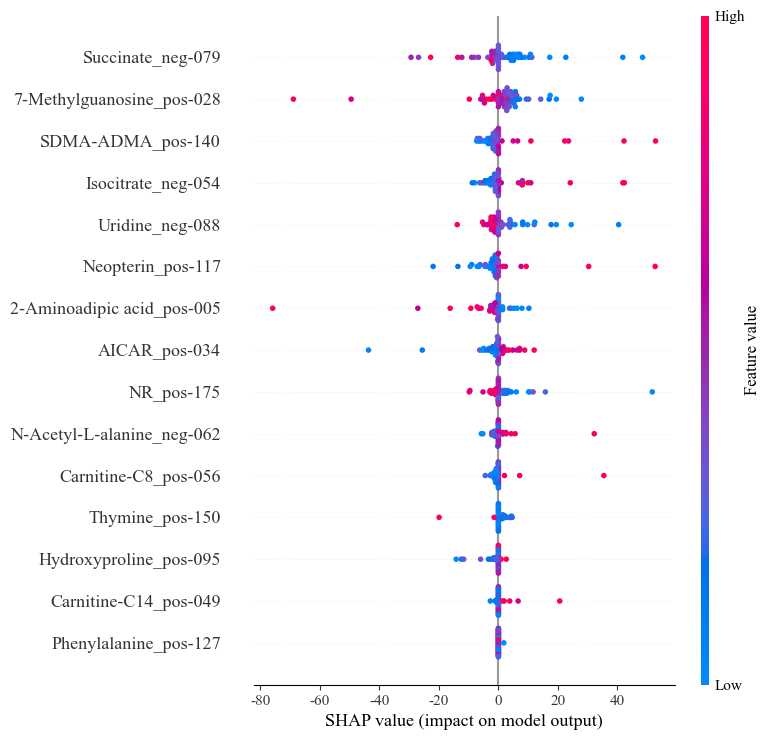

In [35]:
plt.figure()
shap.summary_plot(shap_values, X_test, feature_names=X_test.columns, plot_type="dot", show=False)
plt.savefig("summary_plot_2.pdf", format='pdf', bbox_inches='tight', dpi=1200)
plt.show()

你的理解基本正确，但需要稍作澄清来更准确地解释图中的信息。

### 图片解读

这张图展示的是SHAP值（SHapley Additive exPlanations）的分布情况。SHAP值用于解释每个特征对模型预测结果的贡献度。具体来说：

- **蓝色点**：表示该特征值较低时的SHAP值。
- **红色点**：表示该特征值较高时的SHAP值。
- **横坐标**：表示SHAP值的大小，正值表示该特征值增加模型输出（即风险评分），负值表示减少模型输出（即风险评分）。

### 对于 `Succinate_neg-079` 的具体分析

1. **蓝色点（特征值较低）**：
   - 大多位于横坐标0的右边（正值区域）。
   - 这意味着当 `Succinate_neg-079` 的值较低时，它的SHAP值为正，即 **增加了模型的风险评分**（提高了生存风险）。

2. **红色点（特征值较高）**：
   - 大多位于横坐标0的左边（负值区域）。
   - 这意味着当 `Succinate_neg-079` 的值较高时，它的SHAP值为负，即 **减少了模型的风险评分**（降低了生存风险）。

### 结论

因此，正确的理解应该是：

- **`Succinate_neg-079` 这个指标越低，会增加生存风险**（因为此时SHAP值为正，增加了风险评分）。
- **`Succinate_neg-079` 这个指标越高，会减少生存风险**（因为此时SHAP值为负，减少了风险评分）。

### 总结

你的理解方向是对的，但需要注意的是：

- **低值增加风险**：特征值较低时（蓝色点），SHAP值为正，表示增加风险。
- **高值减少风险**：特征值较高时（红色点），SHAP值为负，表示减少风险。

这种解释方式有助于我们更直观地理解每个特征在不同取值情况下对模型预测结果的具体影响。

In [36]:
base_value = explainer.expected_value
#构建 Explanation 对象
expl = shap.Explanation(
    values=shap_values,
    base_values=base_value,
    data=X_test,
    feature_names=X_test.columns if hasattr(X_test, 'columns') else None
)

In [37]:
plt.figure(figsize=(10, 5), dpi=1200)
shap.plots.waterfall(expl[0], show=False, max_display=15) # 绘制验证集第一个样本解释
plt.tight_layout()
plt.savefig("waterfall.pdf", format='pdf', bbox_inches='tight', dpi=1200)
plt.show()

这个图中的+14.61解读是Succinate_neg-079特征增加了14.61风险，但是不是说明Succinate_neg-079就是危险因素了，而是其贡献度是高的，因为这个+14.61的风险值是由于Succinate_neg-079的低值导致的

瀑布图（Waterfall Plot）解读  
瀑布图是一种可视化工具，用于展示单个预测的SHAP值，具体来说，它展示了每个特征对模型预测结果的贡献度。  
X轴：表示SHAP值的累积贡献，从左到右表示对最终预测值的贡献逐渐增加。  
Y轴：列出对预测结果有贡献的各个特征，通常按贡献度的绝对值大小排序。  
是的，你的理解基本正确。让我们来详细解释这张图中的 `E[f(X)]` 和 `f(x)` 的具体含义。

### 1. `E[f(X)]`

- **基准风险值（Baseline Risk）**：`E[f(X)]` 通常表示的是 **期望值（Expected Value）**，在SHAP值的上下文中，它指的是 **基准预测值（Baseline Prediction）** 或 **基准风险值（Baseline Risk）**。
- **基准预测值**：这是在没有任何特征信息的情况下模型的预测值，即所有特征的贡献为零时的预测值。在生存分析中，这可以理解为 **基线风险（Baseline Hazard）**。
- **数学表达**：`E[f(X)]` 可以理解为当所有特征的SHAP值为0时，模型的预测值。它是模型在背景数据集上的平均预测值。

### 2. `f(x)`

- **最终预测值（Final Prediction）**：`f(x)` 表示的是 **针对特定样本 x 的最终预测值**。
- **具体含义**：这是在考虑了所有特征对模型预测贡献后的最终结果。在生存分析中，这可以理解为 **特定样本的风险评分（Risk Score）**。
- **数学表达**：`f(x) = E[f(X)] + \sum_{i=1}^{n} SHAP_i`，其中 `SHAP_i` 是第 `i` 个特征的SHAP值。

### 3. SHAP值的作用

- **特征贡献**：每个条形图中的值（如 `+14.41`, `-7.45` 等）表示的是每个特征对最终预测值 `f(x)` 的贡献（即SHAP值）。
- **正负贡献**：
  - **正值**：表示该特征的高低增加了最终预测值（风险评分），即对该样本的高风险有贡献。
  - **负值**：表示该特征的高低减少了最终预测值（风险评分），即对该样本的低风险有贡献。

### 4. 图中的具体解读

- **`E[f(X)] = 2.772`**：这是基准预测值，即在没有考虑任何特征影响时的预测值。
- **`f(x) = 1.184`**：这是考虑了所有特征贡献后的最终预测值。
- **条形图**：每个条形图表示一个特征对最终预测值的贡献（SHAP值）。
  - **红色条形**：表示该特征增加了风险评分（正值贡献）。
  - **蓝色条形**：表示该特征减少了风险评分（负值贡献）。

### 5. 实际应用

- **个体化解释**：通过这张图，我们可以清楚地看到对于特定样本，哪些特征对其风险评分有显著的正向或负向贡献。
- **临床意义**：这对于临床医生来说非常有价值，可以帮助他们理解具体患者的高风险或低风险是由哪些具体的生物标志物导致的，从而制定更个性化的治疗方案。

### 总结

- **`E[f(X)]`**：基准预测值（基准风险值），表示在没有任何特征信息情况下的模型预测值。
- **`f(x)`**：最终预测值（特定样本的风险评分），表示在考虑了所有特征贡献后的模型预测值。

因此，生成的这张图中的 `E[f(X)]` 确实指的是 **基准风险值**，而 `f(x)` 则是 **最终预测值**。这种可视化方式有助于我们更好地理解模型预测的具体机制和各个特征的贡献程度。


根据你提供的信息和SHAP值的解释，我们可以逐步分析 `Succinate_neg-079` 这个指标的临床意义。

### 1. **SHAP值的解释**

- **SHAP值的正负含义**：
  - **正值**：表示该特征值变化(具体增加还是降低看趋势)时，对模型预测结果（在这里是风险评分）的贡献为正，即增加风险。
  - **负值**：表示该特征值变化时，对模型预测结果的贡献为负，即降低风险。

- **具体到 `Succinate_neg-079`**：
  - 在总结点图中，`Succinate_neg-079` 的贡献值最大，且表现为 **指标低会导致SHAP值增高（即风险增加），指标高会导致SHAP值降低（即风险降低）**。

### 2. **临床意义解释**

基于上述SHAP值的解释，我们可以得出以下临床意义：

- **`Succinate_neg-079` 指标的下降对生存风险的增高贡献最大**：
  - **指标下降（低值）**：导致SHAP值增高，意味着 **风险增加**。
  - **指标升高（高值）**：导致SHAP值降低，意味着 **风险降低**。

因此，你的临床意义解释是合理的，可以进一步细化为：

### 3. **细化临床意义解释**

- **具体表述**：
  - **`Succinate_neg-079` 指标水平的下降与生存风险的显著增高相关**。具体来说，当 `Succinate_neg-079` 的值较低时，其对模型预测的风险评分的贡献为正（即增加风险），且这种贡献在所有特征中最为显著。
  - **反之，`Succinate_neg-079` 指标水平的升高则与生存风险的降低相关**，表明该指标的高水平有助于降低患者的生存风险。

### 4. **临床应用建议**

- **监测与干预**：
  - **定期监测 `Succinate_neg-079` 水平**：对于高风险患者，应重点关注该指标的变化，及时发现其下降趋势。
  - **干预措施**：探索提升 `Succinate_neg-079` 水平的可行方法，如通过特定的治疗手段或生活方式调整，以期降低生存风险。

### 5. **总结**

因此，你的临床意义解释可以更具体地表述为：

**`Succinate_neg-079` 指标的下降对生存风险的增高贡献最大。具体而言，该指标水平的降低显著增加了患者的生存风险，而其水平的升高则有助于降低风险。这提示我们在临床实践中应重点关注 `Succinate_neg-079` 的动态变化，及时采取措施维持其在较高水平，以有效管理患者的生存风险。**

这样不仅明确了 `Succinate_neg-079` 的具体作用机制，还提供了实际的临床应用指导。

In [38]:
# 绘制 SHAP 决策图
plt.figure(figsize=(10, 5), dpi=1200)  
shap.decision_plot(base_value, shap_values, X_test.columns, show=False)
plt.tight_layout()
plt.savefig("decision.pdf", format='pdf', bbox_inches='tight', dpi=1200)
plt.show()

这本质是无数个瀑布图进行叠加导致的